## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
# magic
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # fix scaling issues

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

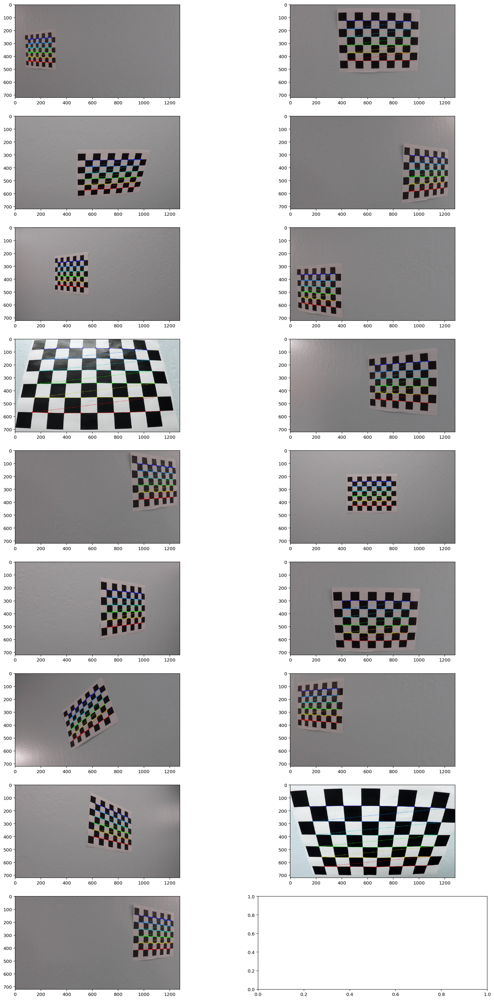

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

out_images = []

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        out_images.append(img)

num_rows = len(out_images) // 2 + 1
num_cols = 2
subplot_idx = 0

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20,40))

for row in np.arange(num_rows):
    for col in np.arange(num_cols):
        if subplot_idx < len(out_images):
            axes[row][col].imshow(out_images[subplot_idx])
            subplot_idx += 1

## Next, calculate the camera distortion coefficients:

In [4]:
# get camera matrix from image / object points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Apply distortion correction to the calibration images (for writeup):

In [12]:
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite("camera_cal_output/{}".format(fname), undist)

## Apply distortion correction to the raw images:

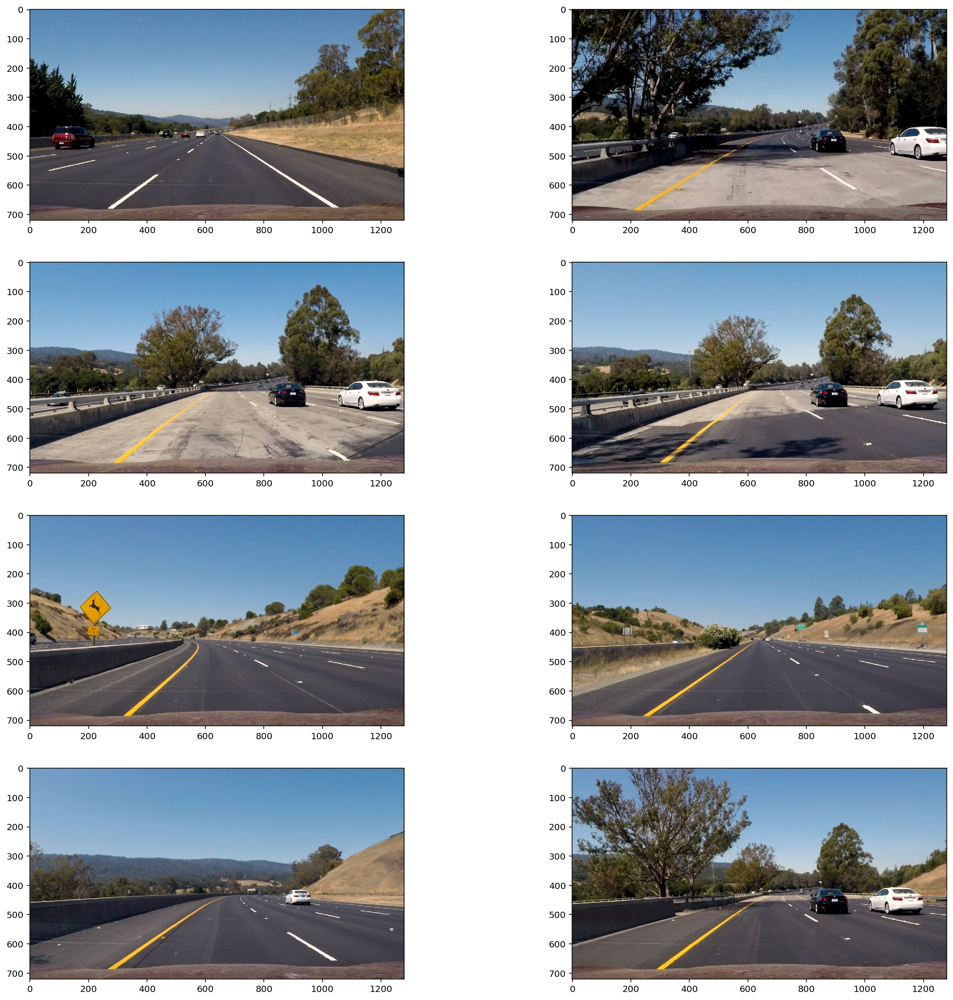

In [15]:
images = glob.glob('test_images/*.jpg')

test_images = []

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    test_images.append(img)
    undist = cv2.cvtColor(undist, cv2.COLOR_RGB2BGR)
    cv2.imwrite("test_images_output/{}".format(fname), undist)
    
num_rows = len(test_images) // 2
num_cols = 2
subplot_idx = 0

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20,20))

for row in np.arange(num_rows):
    for col in np.arange(num_cols):
        if subplot_idx < len(test_images):
            axes[row][col].imshow(test_images[subplot_idx])
            subplot_idx += 1

## Apply thresholds to create binary images:

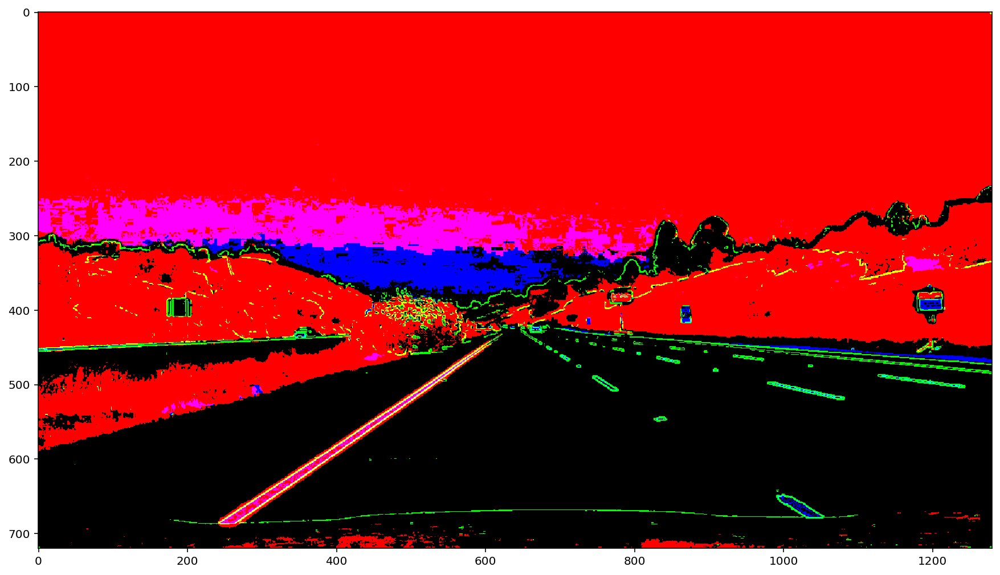

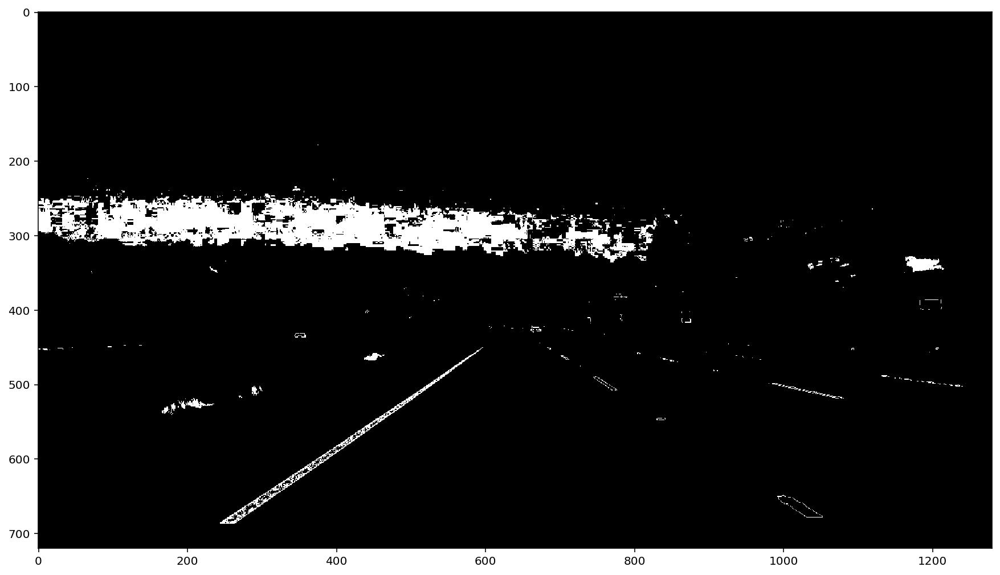

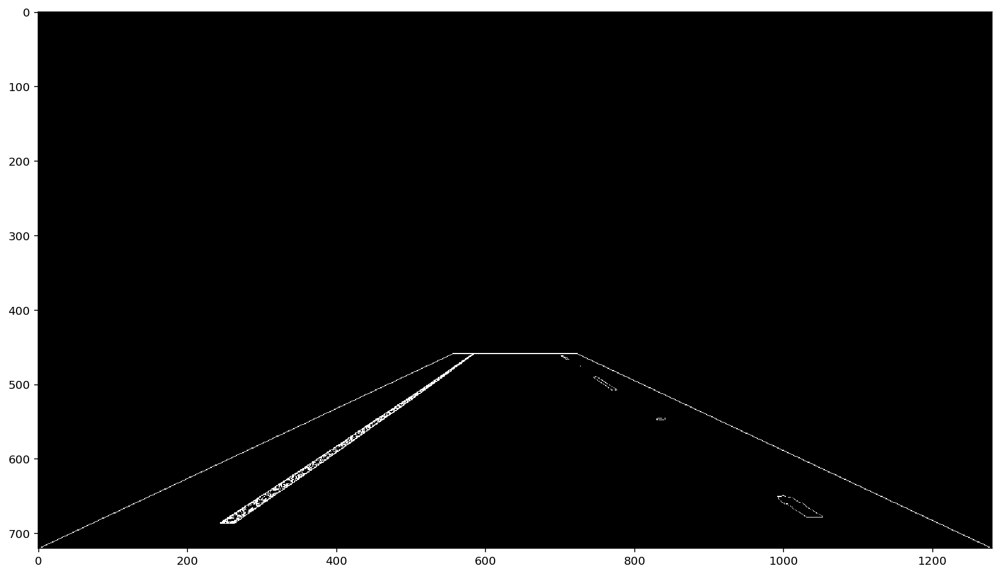

True

In [23]:
input_image = test_images[5]

img = np.copy(input_image)

# convert to grayscale for Sobel
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# extract Sobel and scale
sobel_kernel = 9

sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)

sobel_mag = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
scaled_sobel = np.uint8(255*(sobel_mag / np.max(sobel_mag)))

sobel_thresh = (60, 255)
sobel_binary = np.zeros_like(scaled_sobel)
sobel_binary[(scaled_sobel > sobel_thresh[0]) & (scaled_sobel < sobel_thresh[1])] = 1

# convert to HSV for color space thresholding
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

# isolate and threshold S (saturation) channel
S = hsv_img[:,:,1]
s_thresh = (75, 255)
s_binary = np.zeros_like(S)
s_binary[(S > s_thresh[0]) & (S < s_thresh[1])] = 1

# isolate and threshold V (value) channel
V = hsv_img[:,:,2]
v_thresh = (200, 255)
v_binary = np.zeros_like(S)
v_binary[(V > v_thresh[0]) & (V < v_thresh[1])] = 1

# stack binaries to search for patterns
stacked_binary = np.zeros_like(hsv_img)
stacked_binary[:,:,0] = s_binary * 255
stacked_binary[:,:,1] = sobel_binary * 255
stacked_binary[:,:,2] = v_binary * 255

# create final binary
final_binary = np.zeros_like(s_binary)

# isolate pink or lime regions in RGB colorspace --> (r & b) | (g & b) 
final_binary[((s_binary > 0) & (v_binary > 0)) | ((sobel_binary > 0) & (v_binary > 0))] = 1

# create masked binary
masked_binary = np.copy(final_binary)

# get image dimensions
xsize = masked_binary.shape[1]
ysize = masked_binary.shape[0]

# set mask corners
TL = (int((xsize/2) - (xsize / 15.5)), int(ysize - (ysize/2.75)))
TR = (int((xsize/2) + (xsize / 15.5)), int(ysize - (ysize/2.75)))
BL = (0, ysize)
BR = (int(xsize), ysize)

# calculate mask lines
left = np.polyfit((BL[0], TL[0]), (BL[1], TL[1]), 1)
right = np.polyfit((TR[0], BR[0]), (TR[1], BR[1]), 1)
top = np.polyfit((TL[0], TR[0]), (TL[1], TR[1]), 1)
bottom = np.polyfit((BL[0], BR[0]), (BL[1], BR[1]), 1)

# create meshgrid
XX,YY = np.meshgrid((np.arange(0,xsize)), np.arange(0,ysize))

# populate meshgrid
region_mask = (YY > (top[0] * XX + top[1])) & \
               (YY > (right[0] * XX + right[1])) & \
               (YY > (left[0] * XX + left[1])) & \
               (YY < (bottom[0] * XX + bottom[1]))

# mask image
masked_binary[~region_mask] = 0
masked_binary *= 255

pts = np.array([TL, TR, BR, BL])
pts = pts.reshape((-1,1,2))
poly = np.zeros_like(masked_binary)
poly = cv2.polylines(poly,[pts],True,(255,255,255))
result = cv2.addWeighted(masked_binary, 0.3, poly, 0.3, 0)

plt.figure(figsize=(15,15))
plt.imshow(stacked_binary)
plt.figure(figsize=(15,15))
plt.imshow(final_binary, cmap='gray')
plt.figure(figsize=(15,15))
plt.imshow(result, cmap='gray')
plt.show()

cv2.imwrite("test_images_output/stacked_binary.jpg", cv2.cvtColor(stacked_binary, cv2.COLOR_BGR2RGB))
cv2.imwrite("test_images_output/final_binary.jpg", cv2.cvtColor(np.uint8(255*(result / np.max(result))), cv2.COLOR_GRAY2RGB))

## Apply perspective transform:

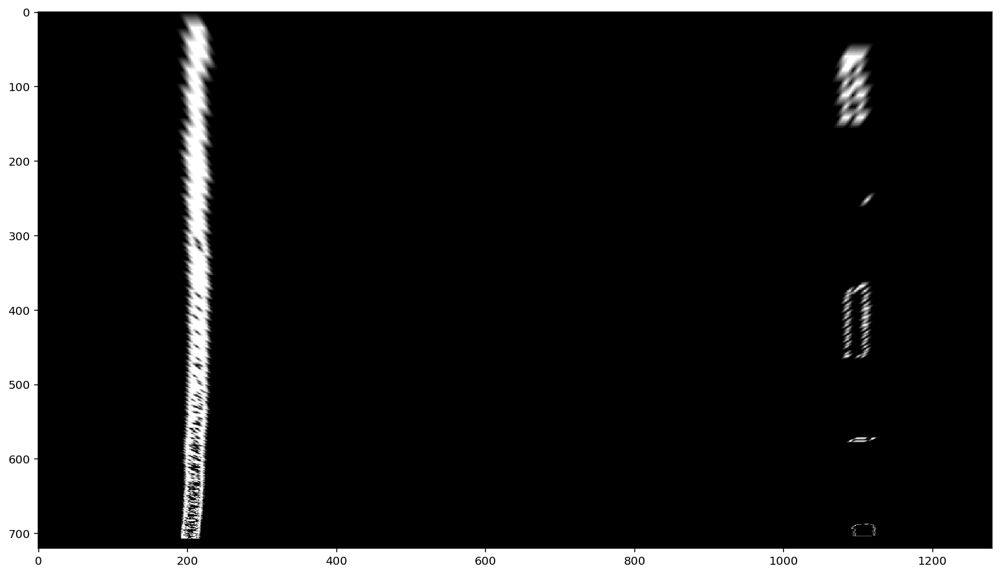

True

In [25]:
img = np.copy(masked_binary)
img_size = (img.shape[1], img.shape[0])
# b) define 4 source points src = np.float32([[,],[,],[,],[,]])
src = np.float32([TL, BL, TR, BR])
# c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
dst = np.float32([[0,0], [0, ysize], [xsize, 0], [xsize, ysize]])
# d) use cv2.getPerspectiveTransform() to get M, the transform matrix
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
# e) use cv2.warpPerspective() to warp your image to a top-down view
binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

plt.figure(figsize=(15,15))
plt.imshow(binary_warped, cmap='gray')
plt.show()
cv2.imwrite("test_images_output/binary_warped.jpg", cv2.cvtColor(binary_warped, cv2.COLOR_GRAY2RGB))

## Detect lane pixels and fit to find lane boundary

In [29]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [44]:
# Define conversions in x and y from pixels space to meters
# ym_per_pix = 30/720 # meters per pixel in y dimension
# xm_per_pix = 3.7/700 # meters per pixel in x dimension

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    for i in range(len(ploty)):
        out_img[int(ploty[i]), int(left_fitx[i])] = (255, 255, 255)
        out_img[int(ploty[i]), int(left_fitx[i]-1)] = (255, 255, 255)
        out_img[int(ploty[i]), int(left_fitx[i]+1)] = (255, 255, 255)
        out_img[int(ploty[i]), int(right_fitx[i])] = (255, 255, 255)
        out_img[int(ploty[i]), int(right_fitx[i]-1)] = (255, 255, 255)
        out_img[int(ploty[i]), int(right_fitx[i]+1)] = (255, 255, 255)
        

    return out_img, left_fit, right_fit, ploty

def fit_polynomial_real(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    return left_fit_cr, right_fit_cr, ploty

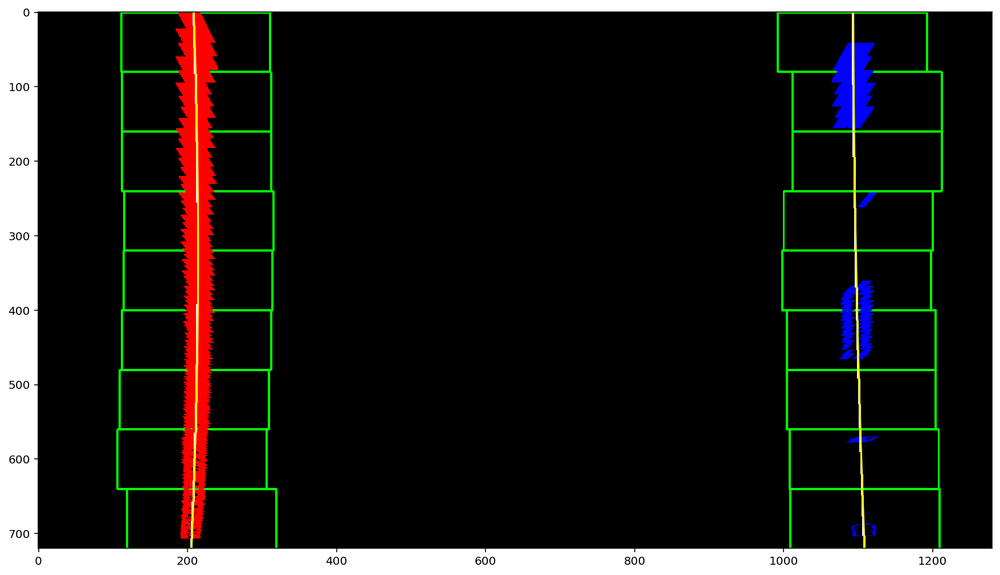

True

In [46]:
plt.figure(figsize=(15,15))

out_img, left_fit, right_fit, ploty = fit_polynomial(binary_warped)

plt.imshow(out_img)
plt.show()

cv2.imwrite("test_images_output/fitted_polynomial.jpg", out_img)

## Determine the curvature of the lane and vehicle position with respect to center.

In [47]:
def measure_curvature_real(img):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty = np.linspace(0, img.shape[0]-1, num=img.shape[1])
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + ((2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2))**(3/2)) / np.abs(2*left_fit_cr[0])  ## Implement the calculation of the left line here
    right_curverad = ((1 + ((2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2))**(3/2)) / np.abs(2*right_fit_cr[0])  ## Implement the calculation of the right line here
    
    return left_curverad, right_curverad

## Warp the detected lane boundaries back onto the original image.

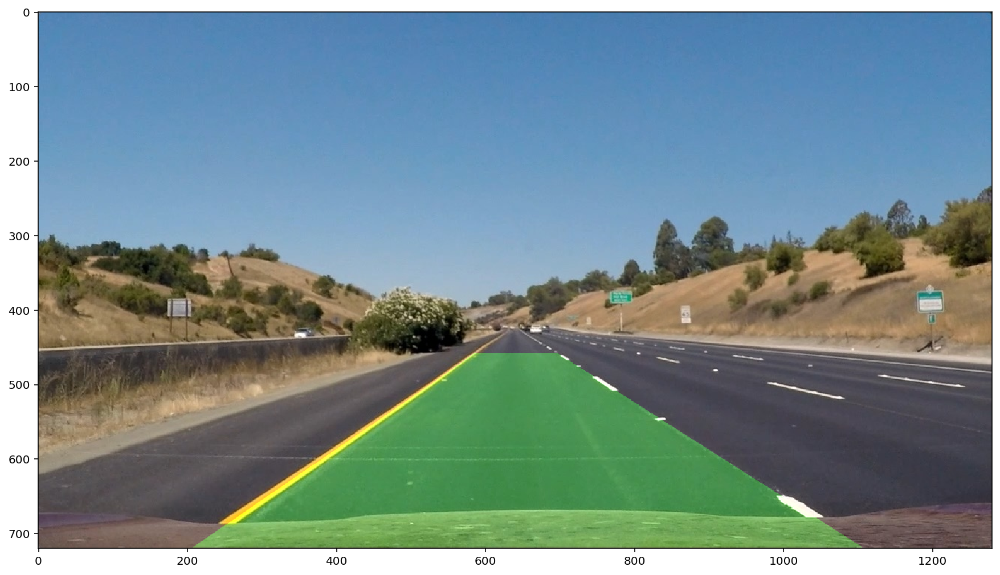

True

In [50]:
# Calculate left_fitx and right_fitx
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (binary_warped.shape[1], binary_warped.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(input_image, 1, newwarp, 0.3, 0)

plt.figure(figsize=(15,15))
plt.imshow(result)
plt.show()

cv2.imwrite("test_images_output/final_output.jpg", cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [112]:
left_base = left_fit[0]*ysize**2 + left_fit[1]*ysize + left_fit[2]
right_base = right_fit[0]*ysize**2 + right_fit[1]*ysize + right_fit[2]

width = right_base - left_base
xm_per_pix = 3.7 / width
ym_per_pix = 12 / (ysize - TL[1])

left_fit_cr, right_fit_cr, ploty = fit_polynomial_real(binary_warped)
left_rad, right_rad = measure_curvature_real(binary_warped)

center = xsize / 2

ldiff = center - left_base
rdiff = right_base - center

# offset = pixels from center
offset = ldiff - rdiff

offset_m = offset * xm_per_pix

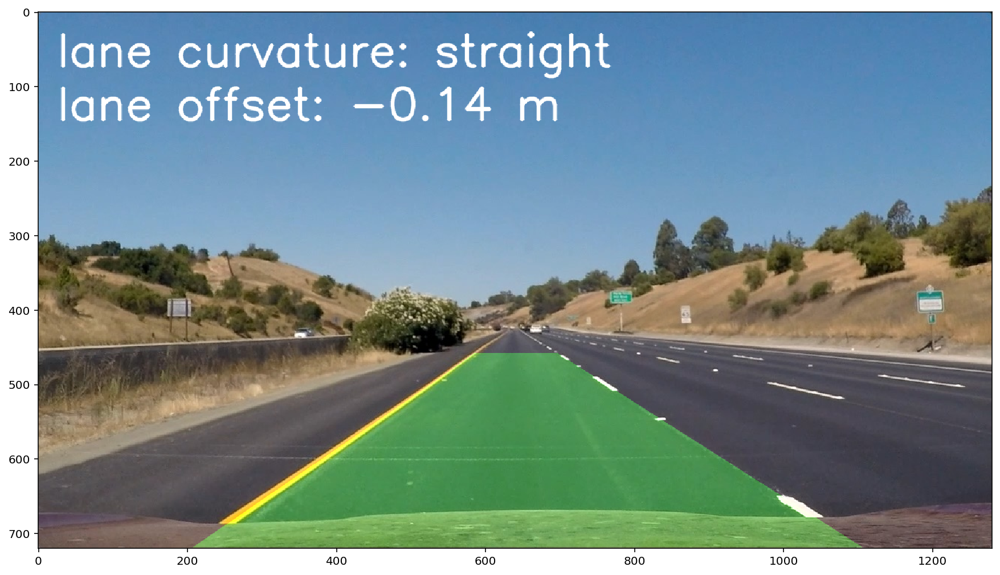

In [116]:
finished_image = np.copy(result)

# text
av_rad = (left_rad + right_rad) / 2
if av_rad < 5000:
    line1 = "lane curvature: {} m".format(av_rad_string)
else:
    av_rad_string = format(av_rad, '.2f')
    line1 = "lane curvature: straight"

offset_m_string = format(offset_m, '.2f')
line2 = "lane offset: {} m".format(offset_m_string)
  
# font 
font = cv2.FONT_HERSHEY_SIMPLEX 
  
# org 
org1 = (int((xsize / 10) * 0.2), int((ysize / 10)))
org2 = (int((xsize / 10) * 0.2), int((ysize / 10) * 2))
  
# fontScale 
fontScale = 2
   
# Red color in BGR 
color = (255, 255, 255) 
  
# Line thickness of 2 px 
thickness = 4
   
# Using cv2.putText() method 
# finished_image = cv2.putText(finished_image, av_rad_string, org, font, fontScale, color, thickness, cv2.LINE_AA, True) 
  
# Using cv2.putText() method 
cv2.putText(finished_image, line1, org1, font, fontScale, color, thickness, cv2.LINE_AA, False) 
cv2.putText(finished_image, line2, org2, font, fontScale, color, thickness, cv2.LINE_AA, False) 
  
# Displaying the image
plt.figure(figsize=(15,15))
plt.imshow(finished_image)
plt.show()

In [317]:
# BACKUP:

img = test_images[3]

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

sobel_kernel=3

sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)

abs_sobel_x = np.abs(sobelx)
abs_sobel_y = np.abs(sobely)

sobelx_thresh = (0, 255)
sobely_thresh = (0, 255)

sobelx_binary = np.zeros_like(sobelx)
sobely_binary = np.zeros_like(sobely)

sobel_mag = np.sqrt(np.square(sobelx) + np.square(sobely))
scaled_sobel = np.uint8(255*(sobel_mag / np.max(sobel_mag)))

sobel_mag_thresh = [100,255]
sobel_mag_binary = np.zeros_like(sobel_mag)
sobel_mag_binary[(sobel_mag > sobel_mag_thresh[0]) & (sobel_mag < sobel_mag_thresh[1])] = 1

dir_gradient = np.arctan2(abs_sobel_y, abs_sobel_x)

dir_thresh = (0.7, 1.2)
masked_dir_gradient = np.zeros_like(dir_gradient)
masked_dir_gradient[(dir_gradient >= dir_thresh[0]) & (dir_gradient <= dir_thresh[1])] = 1

stacked_sobel = np.zeros_like(img)

stacked_sobel[:,:,0] = sobel_mag_binary * 255
stacked_sobel[:,:,1] = masked_dir_gradient * 255

sobel_binary = np.zeros_like(gray)
sobel_binary[(sobel_mag_binary > 0) & (masked_dir_gradient > 0)] = 1

plt.figure(figsize=(15,15))
# plt.imshow(sobel_mag_binary, cmap='gray')
plt.imshow(scaled_sobel, cmap='gray')
plt.figure(figsize=(15,15))
plt.imshow(masked_dir_gradient, cmap='gray')
# plt.imshow(sobel_mag_binary, cmap='gray')
plt.figure(figsize=(15,15))
plt.imshow(sobel_binary, cmap='gray')
plt.show()

# OLD HLS MODEL... DON'T USE

R = img[:,:,0]
G = img[:,:,1]
B = img[:,:,2]

hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

H = hls_img[:,:,0]
L = hls_img[:,:,1]
S = hls_img[:,:,2]

h_thresh = (0, 40)
h_binary = np.zeros_like(H)
h_binary[(H > h_thresh[0]) & (H < h_thresh[1])] = 1

s_thresh = (75, 255)
s_binary = np.zeros_like(S)
s_binary[(S > s_thresh[0]) & (S < s_thresh[1])] = 1

stacked_binary = np.zeros_like(hls_img)
stacked_binary[:,:,0] = s_binary * 255
stacked_binary[:,:,1] = h_binary * 255
stacked_binary[:,:,2] = sobel_binary * 255

final_binary = np.zeros_like(h_binary)
final_binary[((h_binary > 0) & (s_binary > 0)) | ((h_binary > 0) & (s_binary < 1) & (sobel_binary > 0)) | ((sobel_binary > 0)) & (h_binary < 1) & (s_binary < 1)] = 1
# final_binary[((h_binary > 0) & (s_binary < 1) & (sobel_binary > 0))] = 1

plt.figure(figsize=(15,15))
plt.imshow(V, cmap='gray')
plt.figure(figsize=(15,15))
plt.imshow(s_binary, cmap='gray')
plt.figure(figsize=(15,15))
plt.imshow(final_binary, cmap='gray')
# plt.imshow(stacked_binary)
plt.show()